In [1]:
from scipy import stats
import numpy as np
import matplotlib.pyplot as plt
import arviz as az
import pymc as pm
import pandas as pd
import logging
import seaborn as sns
import graphviz
import random

pd.options.mode.chained_assignment = None

random_seed = 6040
az.style.use(['arviz-whitegrid','arviz-royish'])

In [2]:
df = pd.read_csv('weatherAUS.csv')
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


## EDA

/Users/silashayes/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/Users/silashayes/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


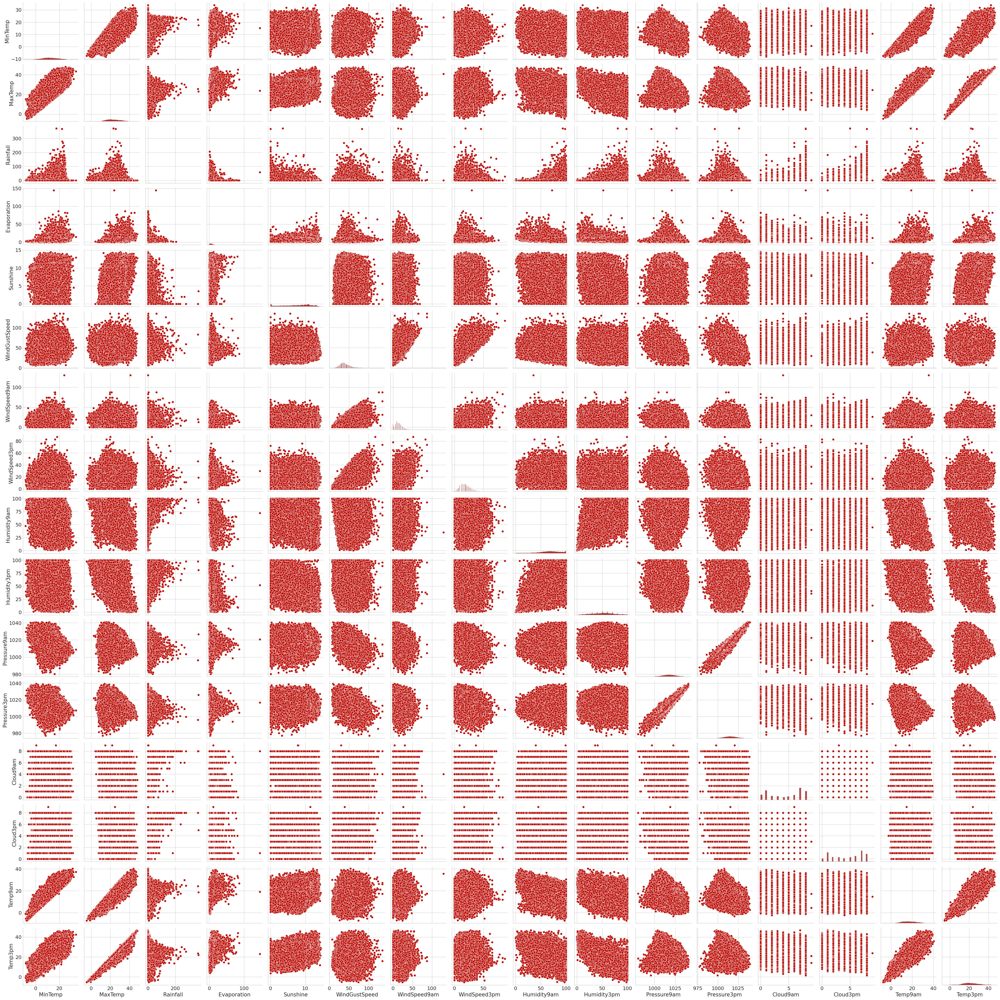

In [3]:
sns.pairplot(df)

In [4]:
df['RainTomorrow'].value_counts() #looks like our classes are not balanced

RainTomorrow
No     110316
Yes     31877
Name: count, dtype: int64

<Axes: xlabel='Rainfall', ylabel='RainTomorrow'>

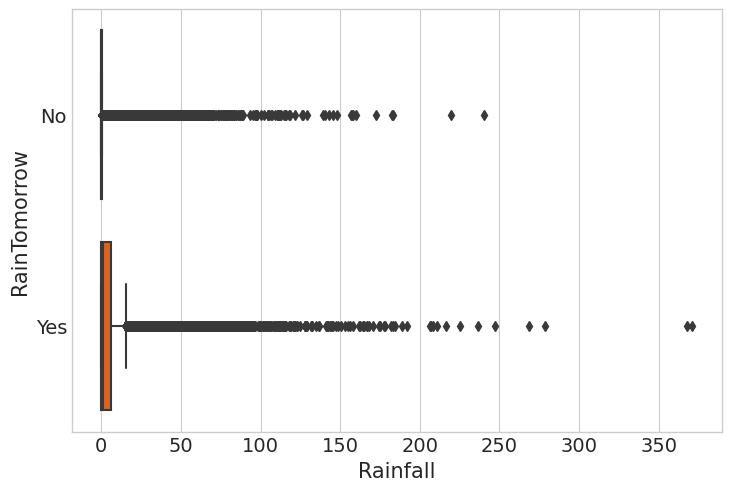

In [5]:
sns.boxplot(df, y='RainTomorrow', x='Rainfall')

<Axes: xlabel='Pressure3pm', ylabel='RainTomorrow'>

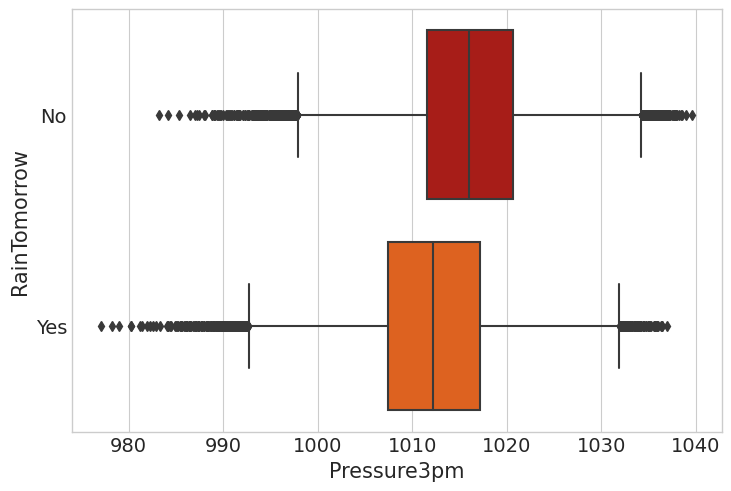

In [6]:
sns.boxplot(df, y='RainTomorrow', x='Pressure3pm')

<Axes: xlabel='Temp3pm', ylabel='RainTomorrow'>

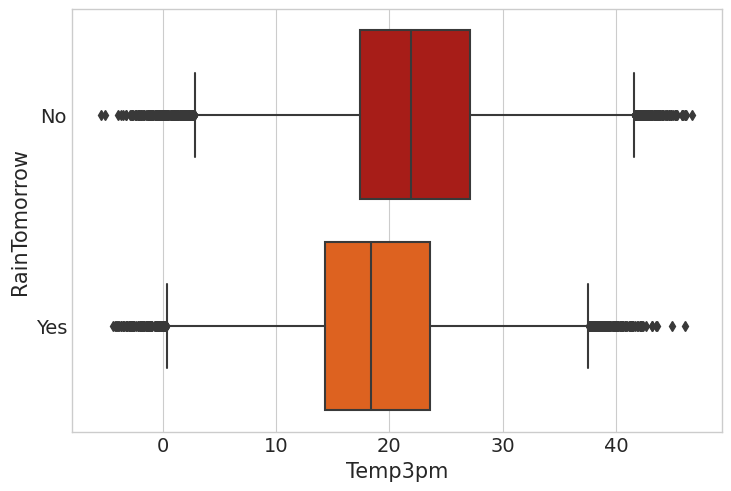

In [7]:
sns.boxplot(df, y='RainTomorrow', x='Temp3pm')

<Axes: xlabel='WindGustSpeed', ylabel='RainTomorrow'>

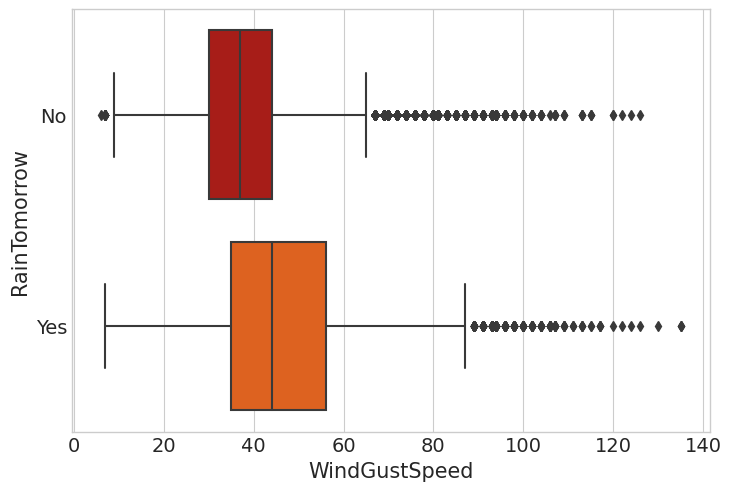

In [8]:
sns.boxplot(df, y='RainTomorrow', x='WindGustSpeed')

<Axes: xlabel='Sunshine', ylabel='RainTomorrow'>

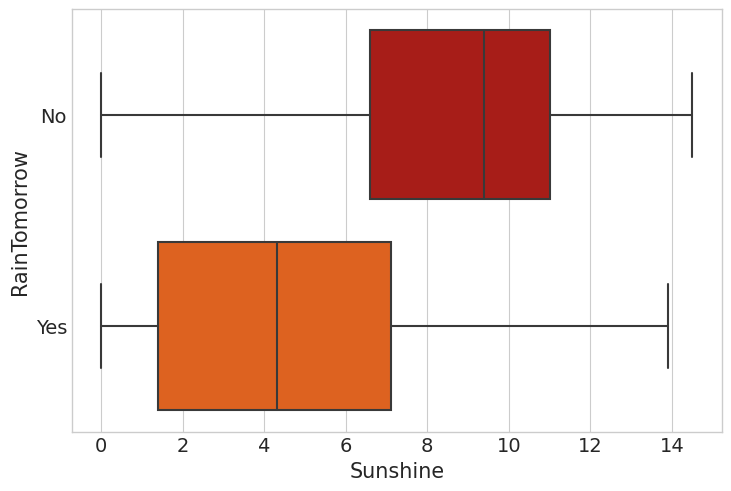

In [9]:
sns.boxplot(df, y='RainTomorrow', x='Sunshine')

<Axes: xlabel='WindSpeed9am', ylabel='RainTomorrow'>

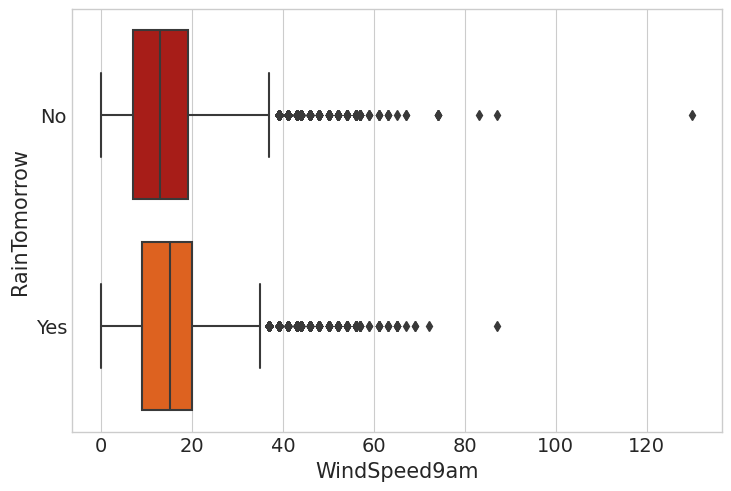

In [10]:
sns.boxplot(df, y='RainTomorrow', x='WindSpeed9am')

Based on our EDA, a lot of our predictors seem to have some correlation with the probability of rain tomorrow; however, they have some overlap as well, meaning we are likely to have models with a large amount of variance. We also might want to perform some feature selection to eliminate some multicollinearity.

## Cleaning

In [11]:
df.isna().sum() / df.shape[0] * 100

Date              0.000000
Location          0.000000
MinTemp           1.020899
MaxTemp           0.866905
Rainfall          2.241853
Evaporation      43.166506
Sunshine         48.009762
WindGustDir       7.098859
WindGustSpeed     7.055548
WindDir9am        7.263853
WindDir3pm        2.906641
WindSpeed9am      1.214767
WindSpeed3pm      2.105046
Humidity9am       1.824557
Humidity3pm       3.098446
Pressure9am      10.356799
Pressure3pm      10.331363
Cloud9am         38.421559
Cloud3pm         40.807095
Temp9am           1.214767
Temp3pm           2.481094
RainToday         2.241853
RainTomorrow      2.245978
dtype: float64

In [12]:
df = df[-df['RainTomorrow'].isna()]
df.isna().sum() / df.shape[0] * 100

Date              0.000000
Location          0.000000
MinTemp           0.447983
MaxTemp           0.226453
Rainfall          0.988797
Evaporation      42.789026
Sunshine         47.692924
WindGustDir       6.561504
WindGustSpeed     6.519308
WindDir9am        7.041838
WindDir3pm        2.656952
WindSpeed9am      0.948007
WindSpeed3pm      1.849599
Humidity9am       1.247600
Humidity3pm       2.538803
Pressure9am       9.855619
Pressure3pm       9.832411
Cloud9am         37.735332
Cloud3pm         40.152469
Temp9am           0.635756
Temp3pm           1.917113
RainToday         0.988797
RainTomorrow      0.000000
dtype: float64

In [13]:
df = df.drop(['Evaporation',
        #'Sunshine', 
              'Cloud9am' 
              #'Cloud3pm'
             ], axis=1)

### Selecting Locations

In [14]:
df.groupby('Location').size().sort_values().index#describe()['Sunshine']

Index(['Uluru', 'Katherine', 'Nhil', 'Melbourne', 'Williamtown', 'PearceRAAF',
       'Walpole', 'Moree', 'MountGinini', 'BadgerysCreek', 'NorahHead',
       'Dartmoor', 'Richmond', 'Witchcliffe', 'CoffsHarbour', 'SalmonGums',
       'Newcastle', 'Penrith', 'NorfolkIsland', 'WaggaWagga', 'GoldCoast',
       'Wollongong', 'Cobar', 'Cairns', 'Woomera', 'Portland', 'Tuggeranong',
       'Watsonia', 'Sale', 'Nuriootpa', 'SydneyAirport', 'Mildura',
       'PerthAirport', 'MelbourneAirport', 'Albury', 'Albany', 'Launceston',
       'Ballarat', 'MountGambier', 'AliceSprings', 'Townsville', 'Bendigo',
       'Adelaide', 'Brisbane', 'Hobart', 'Darwin', 'Perth', 'Sydney',
       'Canberra'],
      dtype='object', name='Location')

/Users/silashayes/anaconda3/lib/python3.11/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


<Axes: xlabel='Location', ylabel='Population'>

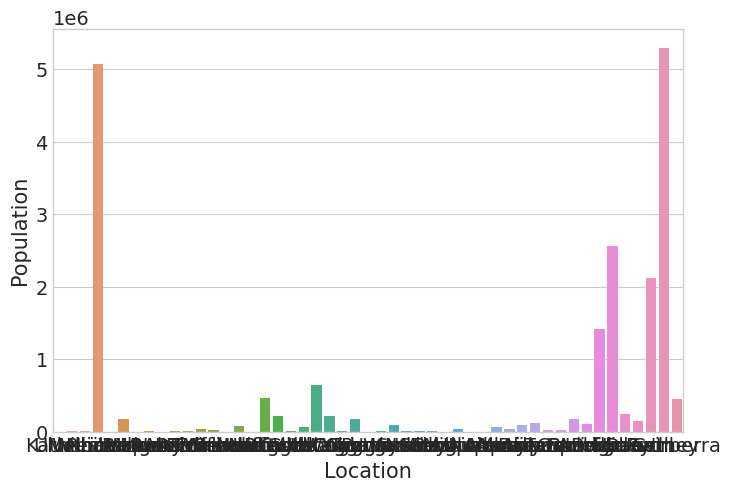

In [15]:
populations = {'Uluru': 300, 'Katherine': 6300, 'Nhil': 1749, 'Melbourne': 5078000, 'Williamtown': 885, 'PearceRAAF': 177513,
       'Walpole': 429, 'Moree': 7070, 'MountGinini': 0, 'BadgerysCreek': 1673, 'NorahHead': 4116,
       'Dartmoor': 33400, 'Richmond': 27705, 'Witchcliffe': 484, 'CoffsHarbour': 78759, 'SalmonGums': 191,
       'Newcastle': 457000, 'Penrith': 220908, 'NorfolkIsland': 1748, 'WaggaWagga': 68337, 'GoldCoast': 647078,
       'Wollongong': 216431, 'Cobar': 4098 , 'Cairns': 171970, 'Woomera': 146, 'Portland': 9946, 'Tuggeranong': 89461,
       'Watsonia': 5437, 'Sale': 14290, 'Nuriootpa': 7633, 'SydneyAirport': 0, 'Mildura': 34565,
       'PerthAirport': 0, 'MelbourneAirport': 0, 'Albury': 56666, 'Albany': 40416, 'Launceston': 90953,
       'Ballarat': 111973, 'MountGambier':25591, 'AliceSprings': 24855, 'Townsville': 179011, 'Bendigo': 100991, 
        'Adelaide': 1418455, 'Brisbane': 2560720, 'Hobart': 247068, 'Darwin': 139902, 'Perth': 2117997, 'Sydney': 5297089, 'Canberra': 453558}

population_df = pd.DataFrame({'Location': populations.keys(),'Population': populations.values()})
population_df['log_pop'] = np.log(population_df['Population'])
sns.barplot(data=population_df, x='Location', y='Population')

<Axes: xlabel='Location', ylabel='log_pop'>

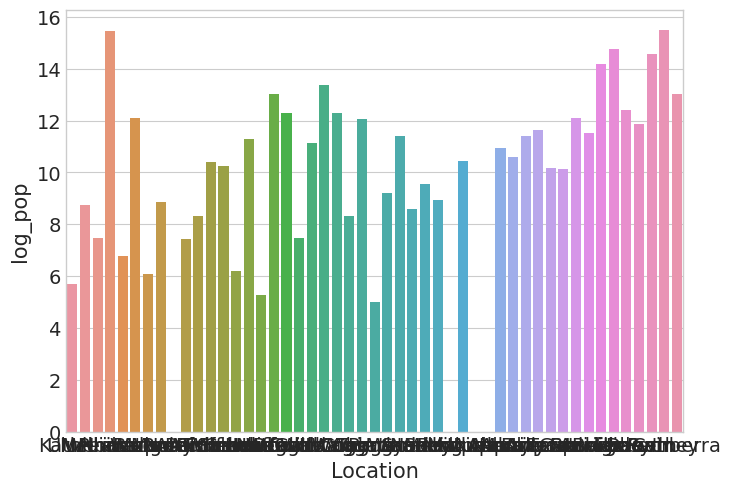

In [16]:
sns.barplot(data=population_df, x='Location', y='log_pop')

In [17]:
above5k = population_df[population_df['Population'] > 5000]['Location'].to_list()

In [18]:
df5k = df[df['Location'].apply(lambda x: True if x in above5k else False)]

### Impute Nulls

In [19]:
#forward propagate by location
df5k.sort_values(by=['Location', 'Date'], inplace=True)
columns_to_ffill = ['MinTemp', 'MaxTemp', 'Rainfall', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 
                    'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 
                    'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm', 'RainToday', 'RainTomorrow']

# Forward-fill within each Location and for selected columns with a limit of 1
df5k[columns_to_ffill] = df5k.groupby('Location')[columns_to_ffill].ffill(limit=1)

# Optionally, you can sort the DataFrame back to its original order
df5k.sort_index(inplace=True)

In [20]:
#impute quantitative variables with median by location
def replace_na(df, value_column, location_column):
    median_values = df.groupby(location_column)[value_column].median()
    
    def replace_nan_with_location_median(row):
        if pd.isna(row[value_column]):
            return median_values[row[location_column]]
        else:
            return row[value_column]
    
    # Apply the function to update NaN values in the specified column
    df[value_column] = df.apply(replace_nan_with_location_median, axis=1)


quantity = ["MinTemp", "Rainfall", "WindGustSpeed", 'MaxTemp', "WindSpeed9am", "WindSpeed3pm", "Humidity9am", "Humidity3pm", "Pressure9am", "Pressure3pm", "Temp9am", "Temp3pm", 'Sunshine', 'Cloud3pm']
#location = list(df5k["Location"].unique())

for q in quantity:
    replace_na(df5k, q, "Location")

In [21]:
##impute categorical variables with mode by location
mode_table = df5k.groupby('Location')[['WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday']].agg(pd.Series.mode)
mode_table.loc['Albany', 'WindGustDir'] = np.nan
mode_table.loc['Newcastle', 'WindGustDir'] = np.nan
mode_table.loc['Watsonia', 'WindDir3pm'] = 'SSW'
mode_table.reset_index(inplace=True)

def fillna_lookup(row, tbl):
    for col in row[['WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday']].index:
        if pd.isna(row[col]):
            row[col] = tbl.loc[tbl['Location'] == row['Location'], col].values[0]
    return row

df5k = df5k.apply(lambda x: fillna_lookup(x, mode_table), axis=1)

In [22]:
#impute any remaining NAs with mode/median of entire dataset

# Replace NaN values in numeric columns with the median
numeric_columns = df5k.select_dtypes(include=['number']).columns
df5k[numeric_columns] = df5k[numeric_columns].apply(lambda x: x.fillna(x.median()))

# Replace NaN values in string columns with the mode
string_columns = df5k.select_dtypes(include=['object']).columns
df5k[string_columns] = df5k[string_columns].apply(lambda x: x.fillna(x.mode().iloc[0]))

In [23]:
df5k.isna().sum() / df5k.shape[0] * 100

Date             0.0
Location         0.0
MinTemp          0.0
MaxTemp          0.0
Rainfall         0.0
Sunshine         0.0
WindGustDir      0.0
WindGustSpeed    0.0
WindDir9am       0.0
WindDir3pm       0.0
WindSpeed9am     0.0
WindSpeed3pm     0.0
Humidity9am      0.0
Humidity3pm      0.0
Pressure9am      0.0
Pressure3pm      0.0
Cloud3pm         0.0
Temp9am          0.0
Temp3pm          0.0
RainToday        0.0
RainTomorrow     0.0
dtype: float64

In [24]:
df5k.drop('Date', axis=1, inplace=True)

In [25]:
df5k['RainTomorrow'] = df5k['RainTomorrow'].map({'Yes': 1, 'No': 0})

### Stratified Undersampling to Balance Classes

In [26]:
location = df5k["Location"].unique()

df = pd.DataFrame()

for l in location:
    new = df5k[(df5k['Location'] == l) & (df5k['RainTomorrow'] == 0)].reset_index(drop=True)
    n = df5k.groupby("Location")["RainTomorrow"].value_counts()[l][1]

    df_new = new.sample(n=n)
    df = pd.concat([df, df_new], ignore_index=True)

In [27]:
df_yay = pd.concat([df, df5k[df5k["RainTomorrow"]==1]], ignore_index=True)

In [28]:
df_yay.groupby("Location")["RainTomorrow"].value_counts()

Location    RainTomorrow
Adelaide    1               688
            0               688
Albany      0               902
            1               902
Albury      1               618
                           ... 
WaggaWagga  1               536
Watsonia    1               738
            0               738
Wollongong  0               713
            1               713
Name: count, Length: 68, dtype: int64

In [29]:
df5k_d = df_yay[['Location', 'Rainfall', 'WindGustSpeed', 'Humidity9am', 'Humidity3pm', 'Pressure3pm', 'Sunshine', 'Pressure9am', 'Cloud3pm', 'Temp3pm', 'RainTomorrow']]

In [30]:
#resort df
df5k_d = df5k_d.sort_values(by=["Location", "RainTomorrow"]).reset_index(drop=True)
#df5k_d.drop("Location", axis=1, inplace=True)

### Scale Numeric Predictors

In [31]:
#scale numeric predictor variables
X = df5k_d[['Rainfall', 'WindGustSpeed', 'Humidity9am', 'Humidity3pm', 'Pressure3pm', 'Sunshine', 'Pressure9am', 'Cloud3pm', 'Temp3pm']]
meanx = X.mean().values
scalex = X.std().values
df5k_d[['Rainfall', 'WindGustSpeed', 'Humidity9am', 'Humidity3pm', 'Pressure3pm', 'Sunshine', 'Pressure9am', 'Cloud3pm', 'Temp3pm']] = ((X-meanx)/scalex).values

In [32]:
b = df5k_d.shape[1] - 2

### Train/Test Split

In [33]:
train_df = df5k_d.drop(['RainTomorrow'], axis=1).sample(frac=0.8, random_state=random_seed)
train_y = df5k_d.loc[train_df.index]['RainTomorrow']
test_df = df5k_d.drop(train_df.index).drop(['RainTomorrow'], axis=1)
test_y = df5k_d.drop(train_df.index)['RainTomorrow']


## Pooled

In [34]:
train_df_p = train_df.drop('Location', axis=1)
test_df_p = test_df.drop('Location', axis=1)

In [35]:
with pm.Model() as pooled_rain:
    # Y = pm.MutableData("Y", df5k['RainTomorrow'].to_numpy())
    # X = pm.MutableData("X", df5k_d)
    Y = pm.MutableData("Y", train_y.to_numpy())
    X = pm.MutableData("X", train_df_p.to_numpy())
    
    Beta0 = pm.Normal("Beta0", mu=0, sigma=10)
    Beta1 = pm.MvNormal('Beta1', mu=np.zeros(b), cov=np.eye(b)*10, shape=b, dims='Predictors')
    
    log_odds = Beta0 + pm.math.dot(X,Beta1)
    p = pm.Deterministic('p', pm.invlogit(log_odds))
    Y_hat = pm.Bernoulli('Y_hat', p=p, observed=Y, shape=X.shape[0])
    
    advi_approx_pooled = pm.fit(50000, method = 'advi', random_seed = random_seed) #50000
    #pooled_trace = pm.sample(4000, tune=2000, random_seed = random_seed, cores = 4) #default 0.8 target_accept=.95
    #pooled_trace_inference = pm.to_inference_data(trace=pooled_trace, log_likelihood=True)
    #pooled_pp = pm.sample_posterior_predictive(pooled_trace, model = pooled_model, random_seed = random_seed, var_names=["Beta0", "Beta1"])

g_pooled_rain=pm.model_to_graphviz(pooled_rain)
g_pooled_rain.render(filename='./figs/g_pooled_rain', format='png', cleanup=True)

Finished [100%]: Average Loss = 17,624


'figs/g_pooled_rain.png'

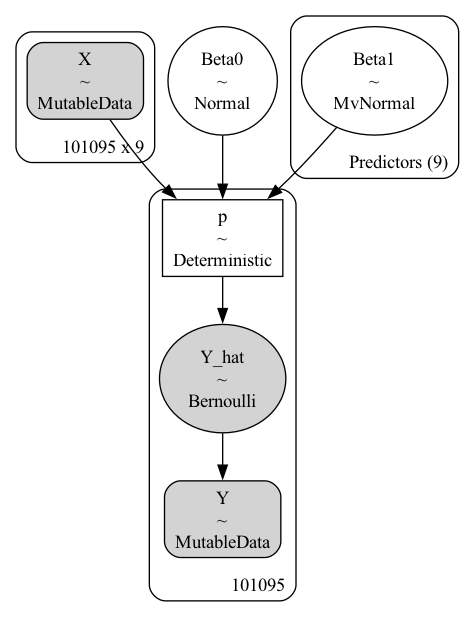

### Convergence

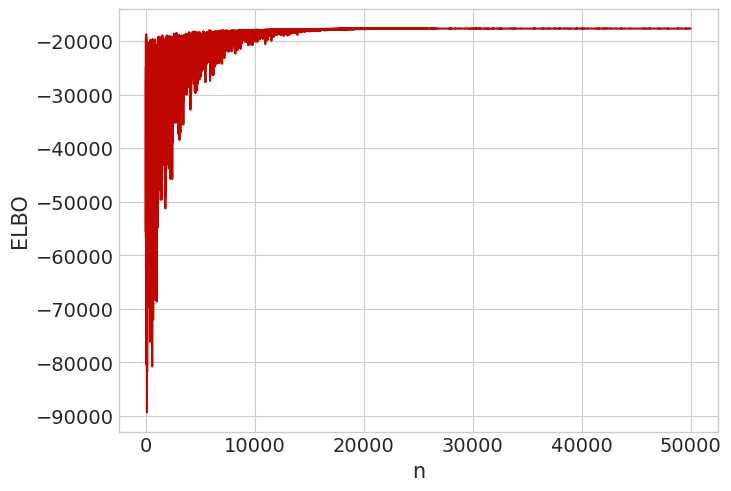

In [36]:
advi_elbo = pd.DataFrame(
    {'ELBO': -advi_approx_pooled.hist,
     'n': np.arange(advi_approx_pooled.hist.shape[0])})

_ = sns.lineplot(y='ELBO', x='n', data=advi_elbo)

### Prior Predictive

Sampling: [Beta0, Beta1, Y_hat]


<Axes: >

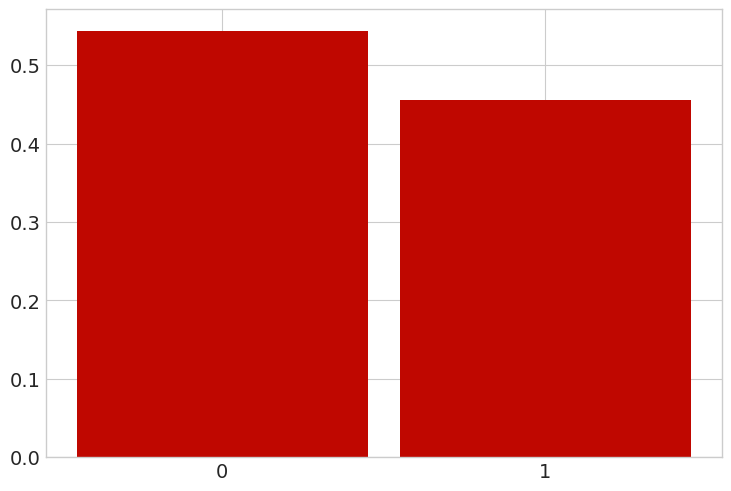

In [37]:
with pooled_rain:
    idata_pooled = pm.sample_prior_predictive(random_seed=random_seed)

az.plot_dist(idata_pooled.prior_predictive['Y_hat'])

### Betas

In [38]:
['Intercept'] + list(train_df.columns)

['Intercept',
 'Location',
 'Rainfall',
 'WindGustSpeed',
 'Humidity9am',
 'Humidity3pm',
 'Pressure3pm',
 'Sunshine',
 'Pressure9am',
 'Cloud3pm',
 'Temp3pm']

array([[<Axes: title={'center': 'Beta0'}>,
        <Axes: title={'center': 'Beta1\n0'}>,
        <Axes: title={'center': 'Beta1\n1'}>],
       [<Axes: title={'center': 'Beta1\n2'}>,
        <Axes: title={'center': 'Beta1\n3'}>,
        <Axes: title={'center': 'Beta1\n4'}>],
       [<Axes: title={'center': 'Beta1\n5'}>,
        <Axes: title={'center': 'Beta1\n6'}>,
        <Axes: title={'center': 'Beta1\n7'}>],
       [<Axes: title={'center': 'Beta1\n8'}>, <Axes: >, <Axes: >]],
      dtype=object)

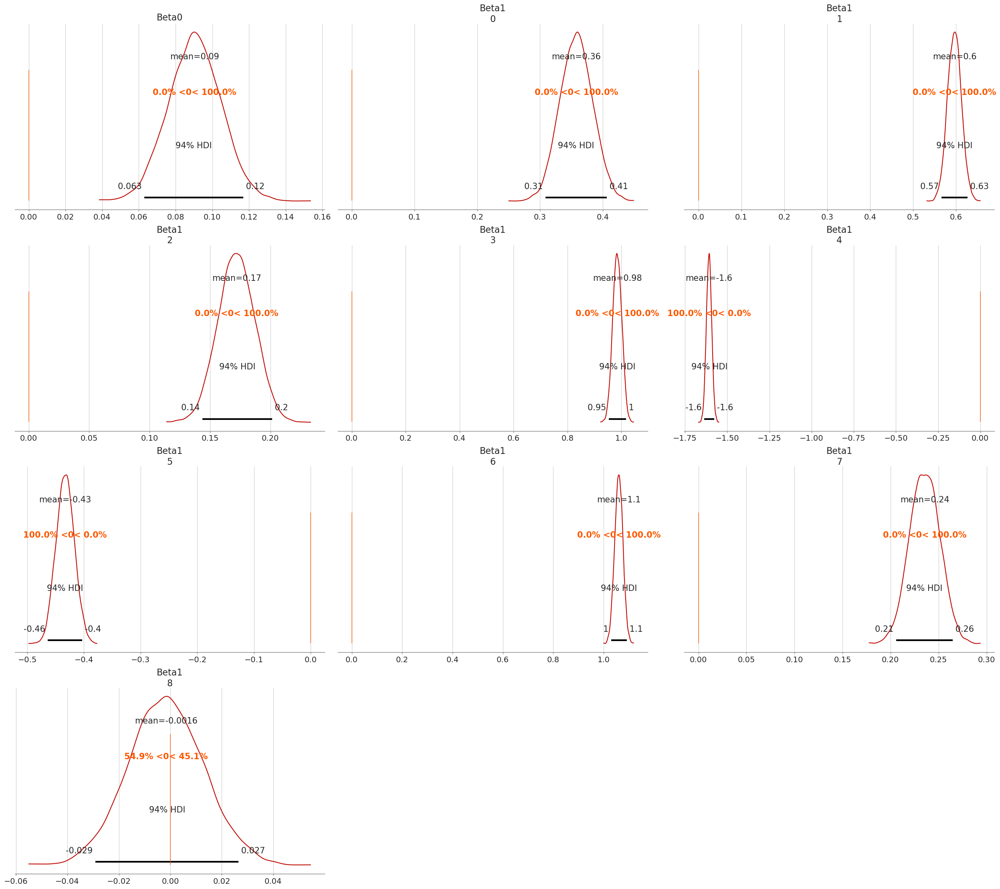

In [39]:
advi_post_pooled = advi_approx_pooled.sample(10000) #1000
az.plot_posterior(advi_post_pooled, var_names=["Beta0", "Beta1"], ref_val=0)

### Posterior Predictive

In [40]:
with pooled_rain:
    ppc_p = pm.sample_posterior_predictive(advi_post_pooled)

Sampling: [Y_hat]


<Axes: xlabel='Y_hat / Y_hat'>

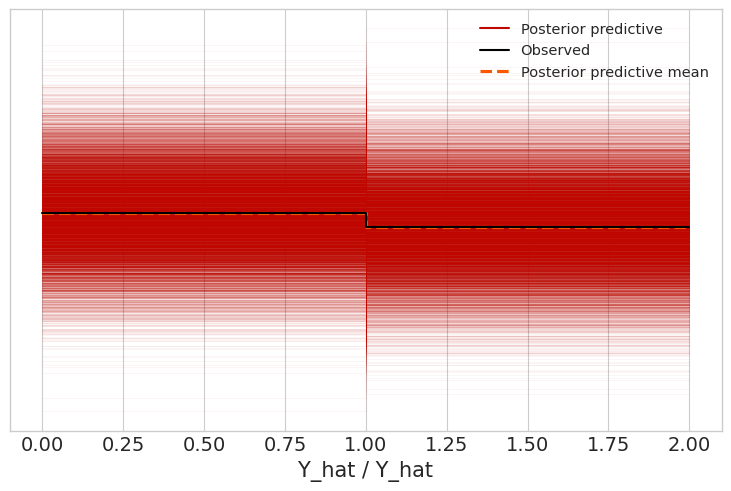

In [106]:
az.plot_ppc(ppc_p, alpha=.04)#, num_pp_samples=5000)

### Bayesian p-value

<Axes: title={'center': 'Y_hat / Y_hat'}>

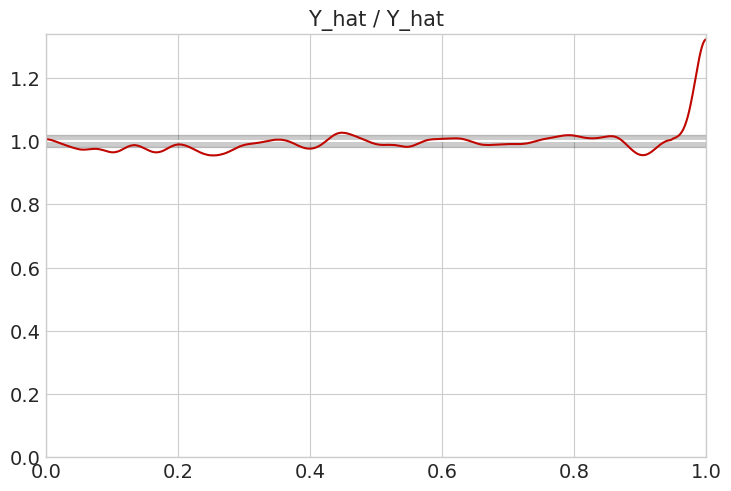

In [42]:
az.plot_bpv(ppc_p)

### Predicting Something

In [43]:
with pooled_rain:
    pm.set_data({'X': test_df_p.to_numpy()})
    ppc_p_pred = pm.sample_posterior_predictive(advi_post_pooled, 
                                                predictions=True,
                                               random_seed=random_seed)

Sampling: [Y_hat]


In [44]:
from sklearn.metrics import confusion_matrix

In [45]:
y_pred_pooled = pd.Series(ppc_p_pred.predictions['Y_hat'].mean(('chain', 'draw'))).apply(lambda x: 1 if x>0.5 else 0)
confuse_pooled = confusion_matrix(test_y, y_pred_pooled)

In [46]:
confuse_pooled

array([[3560,  982],
       [1154, 3427]])

In [47]:
tn, fp, fn, tp = confuse_pooled.ravel()

In [48]:
(tp + tn) / (tn + fp + fn + tp)

0.7658664912857612

In [49]:
test_y.value_counts()

RainTomorrow
1    4581
0    4542
Name: count, dtype: int64

In [50]:
tn

3560

In [51]:
fp

982

In [52]:
fn

1154

In [53]:
tp

3427

### Pretty Graph

In [54]:
new_pressure = np.linspace(min(train_df['Rainfall']), max(train_df['Rainfall']), num=200) #MAYBE CHANGE THIS
new_pressure = np.linspace(-3, 3, num=200)
mean_values = train_df.drop('Location', axis=1).mean()
mean_df = pd.DataFrame(mean_values).transpose()
#mean_df
repeated_mean_df = pd.concat([mean_df] * 200, ignore_index=True)
repeated_mean_df['Rainfall'] = new_pressure
repeated_mean_df

,Rainfall,WindGustSpeed,Humidity9am,Humidity3pm,Pressure3pm,Sunshine,Pressure9am,Cloud3pm,Temp3pm
0,-3.000000,0.000373,-0.003288,-0.001618,-0.000804,0.003256,-0.00092,0.000451,0.004859
1,-2.969849,0.000373,-0.003288,-0.001618,-0.000804,0.003256,-0.00092,0.000451,0.004859
2,-2.939698,0.000373,-0.003288,-0.001618,-0.000804,0.003256,-0.00092,0.000451,0.004859
3,-2.909548,0.000373,-0.003288,-0.001618,-0.000804,0.003256,-0.00092,0.000451,0.004859
4,-2.879397,0.000373,-0.003288,-0.001618,-0.000804,0.003256,-0.00092,0.000451,0.004859
...,...,...,...,...,...,...,...,...,...
195,2.879397,0.000373,-0.003288,-0.001618,-0.000804,0.003256,-0.00092,0.000451,0.004859
196,2.909548,0.000373,-0.003288,-0.001618,-0.000804,0.003256,-0.00092,0.000451,0.004859
197,2.939698,0.000373,-0.003288,-0.001618,-0.000804,0.003256,-0.00092,0.000451,0.004859
198,2.969849,0.000373,-0.003288,-0.001618,-0.000804,0.003256,-0.00092,0.000451,0.004859


In [55]:
with pooled_rain:
    pm.set_data({'X': repeated_mean_df.to_numpy()})
    counterfactual_pred = pm.sample_posterior_predictive(
        advi_post_pooled,
        var_names=['p'],
        return_inferencedata=True,
        predictions=True,
        random_seed=6040)

Sampling: []


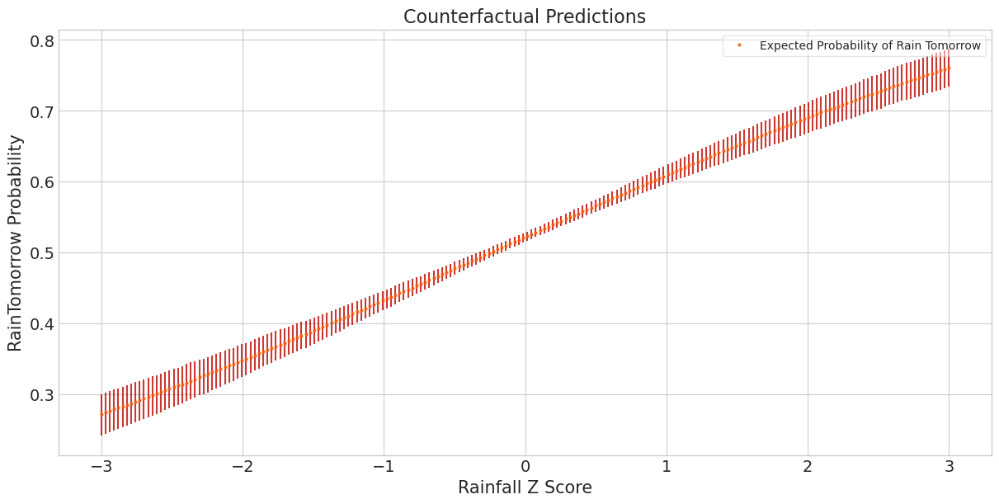

In [56]:
_, ax = plt.subplots(figsize=(12, 6))
preds_counterfactual = counterfactual_pred.predictions_constant_data['X'][:,0] #4 b/c pressure3pm is 4th column
model_preds = counterfactual_pred.predictions

# uncertainty about the estimates:
ax.vlines(
    preds_counterfactual,
    *az.hdi(model_preds)["p"].transpose("hdi", ...),
    alpha=0.8,
)

ax.plot(
    preds_counterfactual,
    model_preds["p"].mean(("chain", "draw")),
    "o",
    ms=2,
    color="C1",
    alpha=0.8,
    label="Expected Probability of Rain Tomorrow")
ax.set_xlabel("Rainfall Z Score")
ax.set_ylabel("RainTomorrow Probability")
ax.set_title("Counterfactual Predictions")
ax.legend(fontsize=10, frameon=True, framealpha=0.5)

Text(0.5, 1.0, 'Rainfall Odds Ratio with 95% CI')

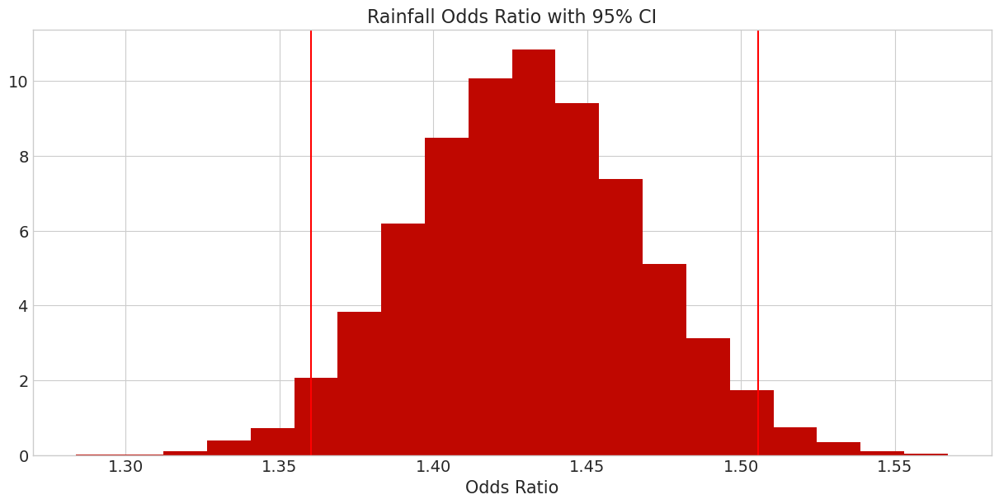

In [57]:
_, ax = plt.subplots(figsize=(12, 6))
b = advi_post_pooled.posterior["Beta1"][:, :, 0]
OR = np.mean(b, axis =0)
lb, ub = np.percentile(OR, 2.5), np.percentile(OR, 97.5)
plt.hist(np.exp(OR), bins=20, density=True)
plt.axvline(np.exp(lb), color = 'r')
plt.axvline(np.exp(ub), color = 'r')
plt.xlabel("Odds Ratio")
plt.title("Rainfall Odds Ratio with 95% CI")

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


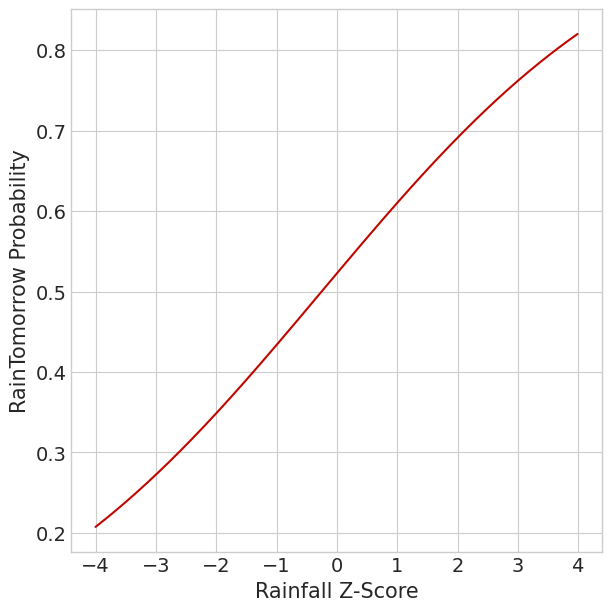

In [58]:
xvals = np.arange(-4, 4, .01)
b0 = advi_post_pooled.posterior['Beta0'].mean(dim=['draw','chain'])
b1 = advi_post_pooled.posterior['Beta1'][:, :, 0].mean(dim=['draw','chain'])

plt.figure(figsize=(6, 6))
yvals = []
for xval in xvals:
    log_odds = b1*xval + b0
    prop = np.exp(log_odds)/(1+np.exp(log_odds))
    yvals.append(prop)
plt.plot(xvals, yvals)

plt.xlabel("Rainfall Z-Score")
plt.legend(fontsize='xx-small', loc='upper right')
plt.ylabel("RainTomorrow Probability");

## Unpooled

Need to fix location_idx so that it generates based on whatever data are input (unpooled and hierarchical)

In [59]:
location_idx = df5k_d.iloc[train_df.index]['Location'].astype("category").cat.codes.values
n_locations = df5k_d.iloc[train_df.index]['Location'].astype("category").cat.categories.size

In [60]:
train_df = train_df.drop('Location', axis=1)
test_df = test_df.drop('Location', axis=1)

In [61]:
with pm.Model() as unpooled_rain:
    Y = pm.MutableData("Y", train_y.to_numpy())
    X = pm.MutableData("X", train_df) #.to_numpy()
    
    location_idx = pm.MutableData("location_idx", location_idx, dims="obs_id")
    
    
    Beta0 = pm.Normal("Beta0", mu=0, sigma=10, shape=n_locations)
    Beta1 = pm.Normal("Beta1", mu=0, sigma=10, shape=n_locations)
    Beta2 = pm.Normal("Beta2", mu=0, sigma=10, shape=n_locations)
    Beta3 = pm.Normal("Beta3", mu=0, sigma=10, shape=n_locations)
    Beta4 = pm.Normal("Beta4", mu=0, sigma=10, shape=n_locations)
    Beta5 = pm.Normal("Beta5", mu=0, sigma=10, shape=n_locations)
    Beta6 = pm.Normal("Beta6", mu=0, sigma=10, shape=n_locations)
    Beta7 = pm.Normal("Beta7", mu=0, sigma=10, shape=n_locations)
    Beta8 = pm.Normal("Beta8", mu=0, sigma=10, shape=n_locations)
    Beta9 = pm.Normal("Beta9", mu=0, sigma=10, shape=n_locations)

    
    log_odds = (Beta0[location_idx] + 
                Beta1[location_idx] * X[:,0] +
                Beta2[location_idx] * X[:,1] + 
                Beta3[location_idx] * X[:,2] + 
                Beta4[location_idx] * X[:,3] +
                Beta5[location_idx] * X[:,4] + 
                Beta6[location_idx] * X[:,5] + 
                Beta7[location_idx] * X[:,6] + 
                Beta8[location_idx] * X[:,7] + 
                Beta9[location_idx] * X[:,8])
    p = pm.Deterministic('p', pm.invlogit(log_odds))
    Y_hat = pm.Bernoulli("Y_hat", p=p, observed=Y, shape=X.shape[0])
    
    # unpooled_trace = pm.sample(1000, tune=1000, random_seed = 6040, cores = 8)
    # unpooled_trace_inference = pm.to_inference_data(trace=unpooled_trace, log_likelihood=True)
    # unpooled_pp = pm.sample_posterior_predictive(unpooled_trace, model = unpooled_model, random_seed = 6040)
    advi_approx_unpooled = pm.fit(50000, method = 'advi', random_seed = random_seed)

g_unpooled_rain=pm.model_to_graphviz(unpooled_rain)
g_unpooled_rain.render(filename='./figs/g_unpooled_rain', format='png', cleanup=True)

Finished [100%]: Average Loss = 17,151


'figs/g_unpooled_rain.png'

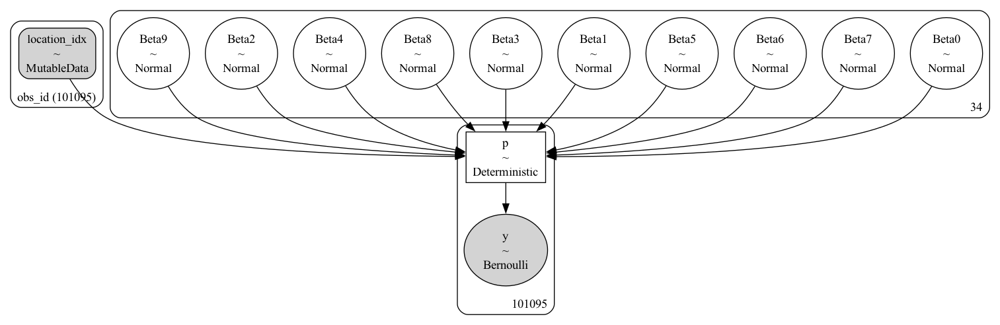

### Convergence

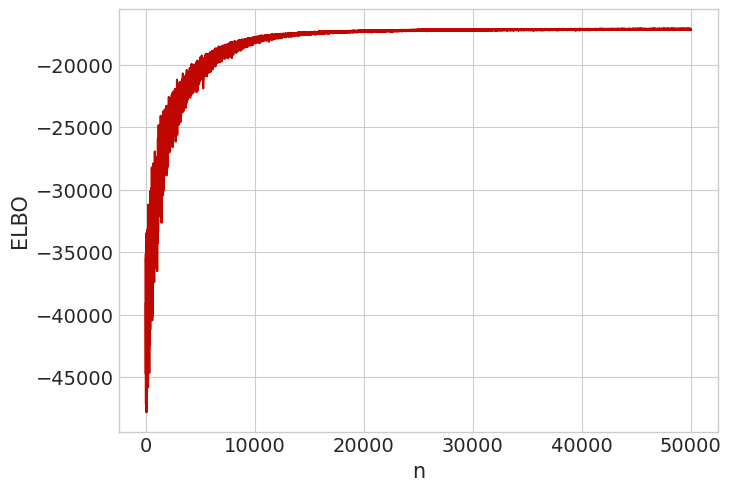

In [62]:
advi_elbo = pd.DataFrame(
    {'ELBO': -advi_approx_unpooled.hist,
     'n': np.arange(advi_approx_unpooled.hist.shape[0])})

_ = sns.lineplot(y='ELBO', x='n', data=advi_elbo)

### Prior Predictive

Sampling: [Beta0, Beta1, Beta2, Beta3, Beta4, Beta5, Beta6, Beta7, Beta8, Beta9, Y_hat]


<Axes: >

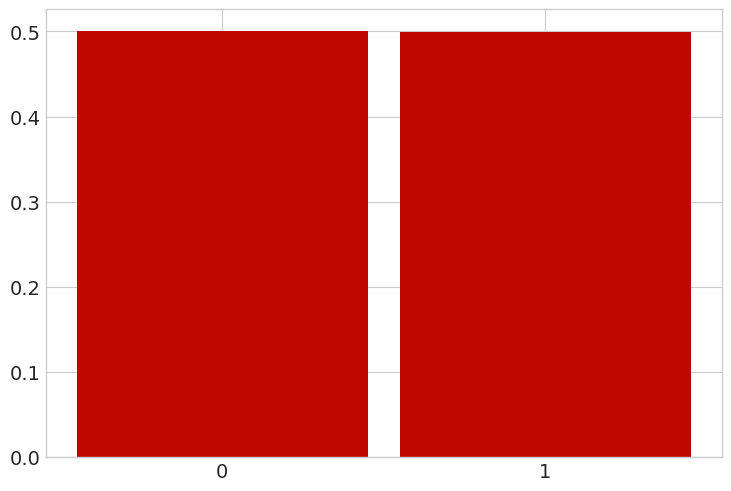

In [63]:
with unpooled_rain:
    idata_unpooled = pm.sample_prior_predictive(random_seed=random_seed)

az.plot_dist(idata_unpooled.prior_predictive['Y_hat'])

### Betas

/Users/silashayes/anaconda3/lib/python3.11/site-packages/arviz/plots/plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (68) in plot_posterior, generating only 40 plots
  warnings.warn(


array([[<Axes: title={'center': 'Beta0\n0'}>,
        <Axes: title={'center': 'Beta0\n1'}>,
        <Axes: title={'center': 'Beta0\n2'}>,
        <Axes: title={'center': 'Beta0\n3'}>],
       [<Axes: title={'center': 'Beta0\n4'}>,
        <Axes: title={'center': 'Beta0\n5'}>,
        <Axes: title={'center': 'Beta0\n6'}>,
        <Axes: title={'center': 'Beta0\n7'}>],
       [<Axes: title={'center': 'Beta0\n8'}>,
        <Axes: title={'center': 'Beta0\n9'}>,
        <Axes: title={'center': 'Beta0\n10'}>,
        <Axes: title={'center': 'Beta0\n11'}>],
       [<Axes: title={'center': 'Beta0\n12'}>,
        <Axes: title={'center': 'Beta0\n13'}>,
        <Axes: title={'center': 'Beta0\n14'}>,
        <Axes: title={'center': 'Beta0\n15'}>],
       [<Axes: title={'center': 'Beta0\n16'}>,
        <Axes: title={'center': 'Beta0\n17'}>,
        <Axes: title={'center': 'Beta0\n18'}>,
        <Axes: title={'center': 'Beta0\n19'}>],
       [<Axes: title={'center': 'Beta0\n20'}>,
        <Axes: tit

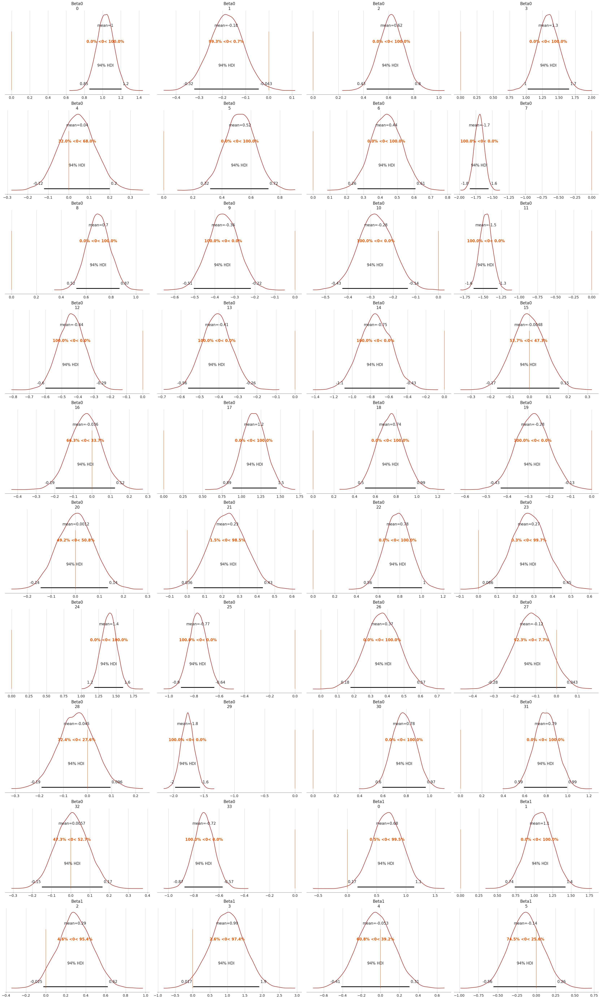

In [64]:
advi_post_unpooled = advi_approx_unpooled.sample(10000)
az.plot_posterior(advi_post_unpooled, var_names=["Beta0", "Beta1"], ref_val=0)

### Posterior Predictive

In [65]:
with unpooled_rain:
    ppc_u = pm.sample_posterior_predictive(advi_post_unpooled)

Sampling: [Y_hat]


<Axes: xlabel='Y_hat / Y_hat'>

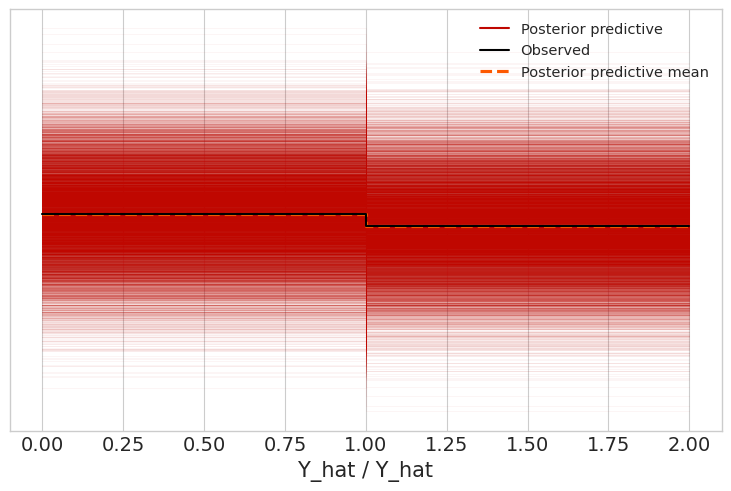

In [107]:
az.plot_ppc(ppc_u, alpha=.04)

### Bayesian p-value

<Axes: title={'center': 'Y_hat / Y_hat'}>

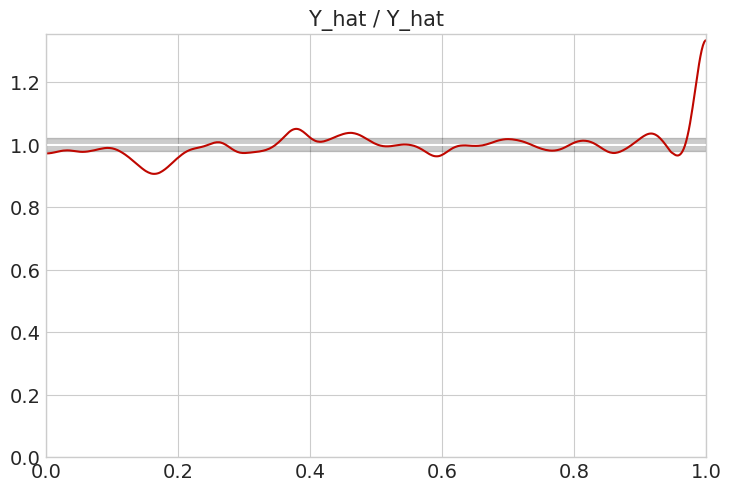

In [67]:
az.plot_bpv(ppc_u)

### Predicting Something

In [68]:
with unpooled_rain:
    pm.set_data({'X': test_df.to_numpy(),
                'location_idx': df5k_d.iloc[test_df.index]['Location'].astype("category").cat.codes.values})
    ppc_u_pred = pm.sample_posterior_predictive(advi_post_unpooled, 
                                                predictions=True,
                                               random_seed=random_seed)

Sampling: [Y_hat]


In [69]:
y_pred_unpooled = pd.Series(ppc_u_pred.predictions['Y_hat'].mean(('chain', 'draw'))).apply(lambda x: 1 if x>0.5 else 0)
confuse_unpooled = confusion_matrix(test_y, y_pred_unpooled)

In [70]:
confuse_unpooled

array([[3644,  898],
       [1003, 3578]])

In [71]:
tn, fp, fn, tp = confuse_unpooled.ravel()

In [72]:
(tp + tn) / (tn + fp + fn + tp)

0.7916255617669626

In [73]:
tn

3644

In [74]:
fp

898

In [75]:
fn

1003

In [76]:
tp

3578

### Pretty Graph

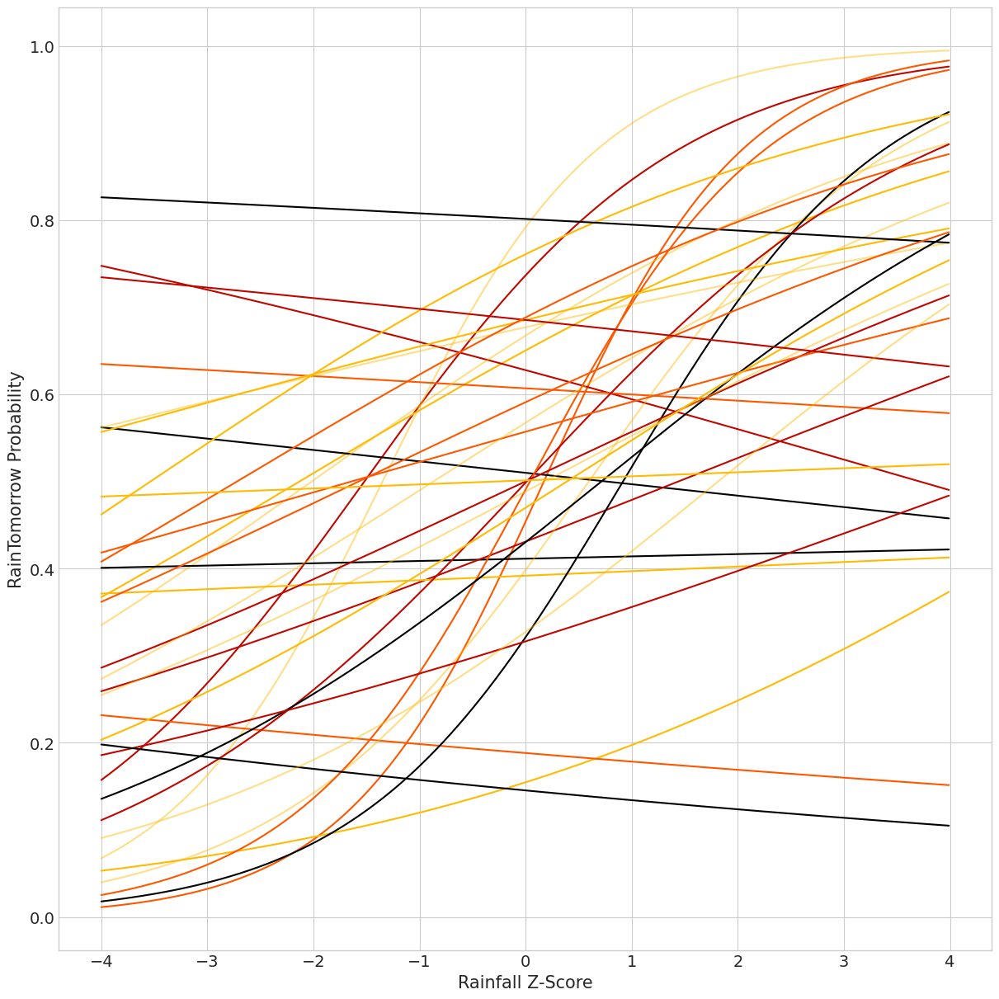

In [77]:
xvals = np.arange(-4, 4, .01)
b0 = advi_post_unpooled.posterior['Beta0'].mean(dim=['draw','chain'])
b1 = advi_post_unpooled.posterior['Beta1'].mean(dim=['draw','chain'])
districts = b1.Beta1_dim_0 + 1

plt.figure(figsize=(12, 12))
for b0i, b1i, dist in zip(b0, b1, districts):
    yvals = []
    for xval in xvals:
        log_odds = b1i*xval + b0i
        prop = np.exp(log_odds)/(1+np.exp(log_odds))
        yvals.append(prop)
    plt.plot(xvals, yvals, label=dist.values)

plt.xlabel("Rainfall Z-Score")
#plt.legend(fontsize='xx-small', loc='upper right')
plt.ylabel("RainTomorrow Probability");

## Hierarchical

In [78]:
with pm.Model() as hierarchical_rain:   
    location_idx = df5k_d.iloc[train_df.index]['Location'].astype("category").cat.codes.values
    n_locations = df5k_d.iloc[train_df.index]['Location'].astype("category").cat.categories.size
    
    Y = pm.MutableData("Y", train_y.to_numpy())
    location_idx = pm.MutableData("location_idx", location_idx, dims="obs_id")
    X = pm.MutableData("X", train_df.to_numpy())
    
    #Hyperpriors:
    Beta0 = pm.Normal("Beta0", mu=0.0, sigma=10)
    sigma_b0 = pm.HalfNormal('sigma_b0', sigma=20)
    Beta1 = pm.Normal("Beta1", mu=0.0, sigma=10)
    sigma_b1 = pm.HalfNormal('sigma_b1', sigma=20)
    Beta2 = pm.Normal("Beta2", mu=0.0, sigma=10)
    sigma_b2 = pm.HalfNormal('sigma_b2', sigma=20)
    Beta3 = pm.Normal("Beta3", mu=0.0, sigma=10)
    sigma_b3 = pm.HalfNormal('sigma_b3', sigma=20)
    Beta4 = pm.Normal("Beta4", mu=0.0, sigma=10)
    sigma_b4 = pm.HalfNormal('sigma_b4', sigma=20)
    Beta5 = pm.Normal("Beta5", mu=0.0, sigma=10)
    sigma_b5 = pm.HalfNormal('sigma_b5', sigma=20)
    Beta6 = pm.Normal("Beta6", mu=0.0, sigma=10)
    sigma_b6 = pm.HalfNormal('sigma_b6', sigma=20)
    Beta7 = pm.Normal("Beta7", mu=0.0, sigma=10)
    sigma_b7 = pm.HalfNormal('sigma_b7', sigma=20)
    Beta8 = pm.Normal("Beta8", mu=0.0, sigma=10)
    sigma_b8 = pm.HalfNormal('sigma_b8', sigma=20)
    Beta9 = pm.Normal("Beta9", mu=0.0, sigma=10)
    sigma_b9 = pm.HalfNormal('sigma_b9', sigma=20)
    
    beta0_district = pm.Normal("beta0_district", mu=Beta0, sigma=sigma_b0, shape=n_locations)
    beta1_district = pm.Normal("beta1_district", mu=Beta1, sigma=sigma_b1, shape=n_locations)
    beta2_district = pm.Normal("beta2_district", mu=Beta2, sigma=sigma_b2, shape=n_locations)
    beta3_district = pm.Normal("beta3_district", mu=Beta3, sigma=sigma_b3, shape=n_locations)
    beta4_district = pm.Normal("beta4_district", mu=Beta4, sigma=sigma_b4, shape=n_locations)
    beta5_district = pm.Normal("beta5_district", mu=Beta5, sigma=sigma_b5, shape=n_locations)
    beta6_district = pm.Normal("beta6_district", mu=Beta6, sigma=sigma_b6, shape=n_locations)
    beta7_district = pm.Normal("beta7_district", mu=Beta7, sigma=sigma_b7, shape=n_locations)
    beta8_district = pm.Normal("beta8_district", mu=Beta8, sigma=sigma_b8, shape=n_locations)
    beta9_district = pm.Normal("beta9_district", mu=Beta9, sigma=sigma_b9, shape=n_locations)
    
    log_odds = (beta0_district[location_idx] + 
                beta1_district[location_idx] * X[:,0] +
                beta2_district[location_idx] * X[:,1] +
                beta3_district[location_idx] * X[:,2] +
                beta4_district[location_idx] * X[:,3] +
                beta5_district[location_idx] * X[:,4] +
                beta6_district[location_idx] * X[:,5] +
                beta7_district[location_idx] * X[:,6] +
                beta8_district[location_idx] * X[:,7] +
                beta9_district[location_idx] * X[:,8])
    p = pm.Deterministic('p', pm.invlogit(log_odds))
    Y_hat = pm.Bernoulli("Y_hat", p=p, observed=Y, shape=X.shape[0])

    # hierarchical_trace = pm.sample(4000, tune=2000, random_seed = 6040, cores = 8)
    # hierarchical_trace_inference = pm.to_inference_data(trace=hierarchical_trace, log_likelihood=True)
    # hierarchical_pp = pm.sample_posterior_predictive(hierarchical_trace, model = hierarchical_model, random_seed = 6040)
    advi_approx_hierarchical = pm.fit(50000, method = 'advi', random_seed = random_seed)
    
g_hierarchical_rain=pm.model_to_graphviz(hierarchical_rain)
g_hierarchical_rain.render(filename='./figs/g_hierarchical_rain', format='png', cleanup=True)

Finished [100%]: Average Loss = 16,359


'figs/g_hierarchical_rain.png'

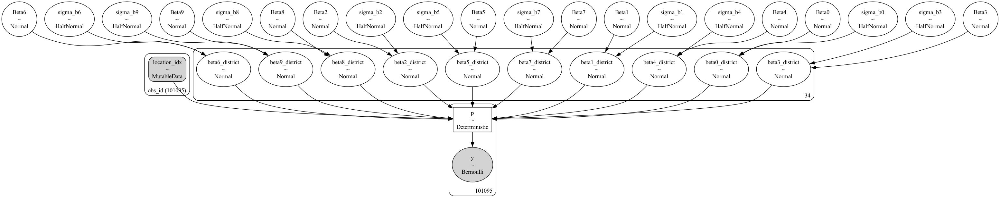

### Convergence

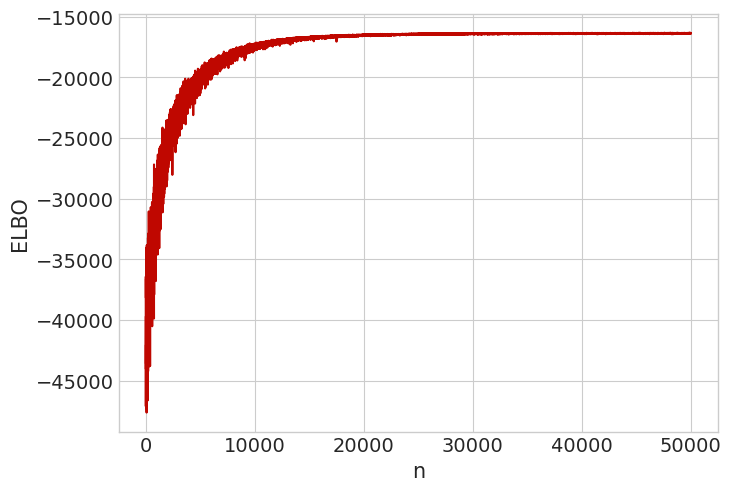

In [79]:
advi_elbo = pd.DataFrame(
    {'ELBO': -advi_approx_hierarchical.hist,
     'n': np.arange(advi_approx_hierarchical.hist.shape[0])})

_ = sns.lineplot(y='ELBO', x='n', data=advi_elbo)

### Prior Predictive

Sampling: [Beta0, Beta1, Beta2, Beta3, Beta4, Beta5, Beta6, Beta7, Beta8, Beta9, Y_hat, beta0_district, beta1_district, beta2_district, beta3_district, beta4_district, beta5_district, beta6_district, beta7_district, beta8_district, beta9_district, sigma_b0, sigma_b1, sigma_b2, sigma_b3, sigma_b4, sigma_b5, sigma_b6, sigma_b7, sigma_b8, sigma_b9]


<Axes: >

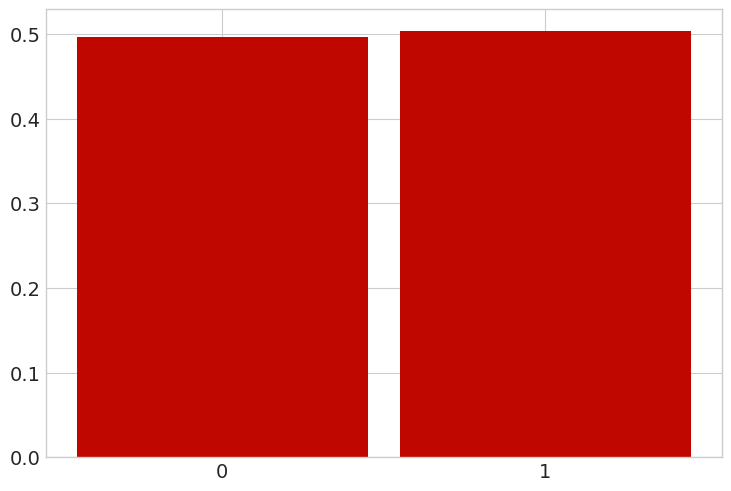

In [80]:
with hierarchical_rain:
    idata_hierarchical = pm.sample_prior_predictive(random_seed=random_seed)

az.plot_dist(idata_hierarchical.prior_predictive['Y_hat'])

### Betas

/Users/silashayes/anaconda3/lib/python3.11/site-packages/arviz/plots/plot_utils.py:271: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (340) in plot_posterior, generating only 40 plots
  warnings.warn(


array([[<Axes: title={'center': 'beta0_district\n0'}>,
        <Axes: title={'center': 'beta0_district\n1'}>,
        <Axes: title={'center': 'beta0_district\n2'}>,
        <Axes: title={'center': 'beta0_district\n3'}>],
       [<Axes: title={'center': 'beta0_district\n4'}>,
        <Axes: title={'center': 'beta0_district\n5'}>,
        <Axes: title={'center': 'beta0_district\n6'}>,
        <Axes: title={'center': 'beta0_district\n7'}>],
       [<Axes: title={'center': 'beta0_district\n8'}>,
        <Axes: title={'center': 'beta0_district\n9'}>,
        <Axes: title={'center': 'beta0_district\n10'}>,
        <Axes: title={'center': 'beta0_district\n11'}>],
       [<Axes: title={'center': 'beta0_district\n12'}>,
        <Axes: title={'center': 'beta0_district\n13'}>,
        <Axes: title={'center': 'beta0_district\n14'}>,
        <Axes: title={'center': 'beta0_district\n15'}>],
       [<Axes: title={'center': 'beta0_district\n16'}>,
        <Axes: title={'center': 'beta0_district\n17'}>

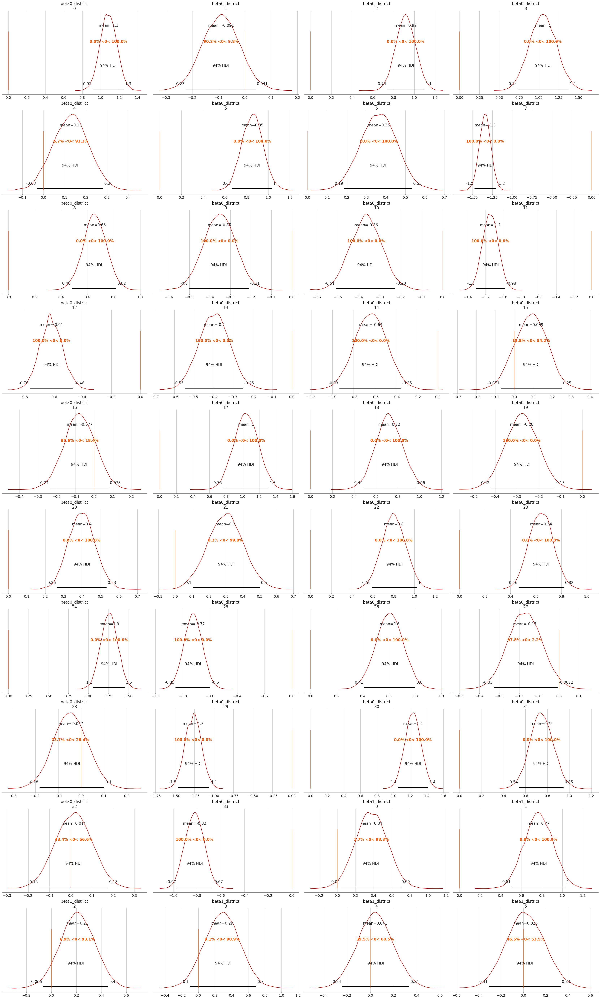

In [81]:
advi_post_hierarchical = advi_approx_hierarchical.sample(10000)
az.plot_posterior(advi_post_hierarchical, var_names=["~Beta0", "~Beta1", "~Beta2", "~Beta3", "~Beta4", "~Beta5", "~Beta6", "~Beta7", "~Beta8", "~Beta9",
                                        "~sigma_b0", "~sigma_b1", "~sigma_b2", "~sigma_b3", "~sigma_b4", "~sigma_b5", "~sigma_b6", "~sigma_b7", "~sigma_b8", "~sigma_b9", 
                                       "~p"], ref_val=0)


### Posterior Predictive

In [82]:
with hierarchical_rain:
    ppc_h = pm.sample_posterior_predictive(advi_post_hierarchical)

Sampling: [Y_hat]


<Axes: xlabel='Y_hat / Y_hat'>

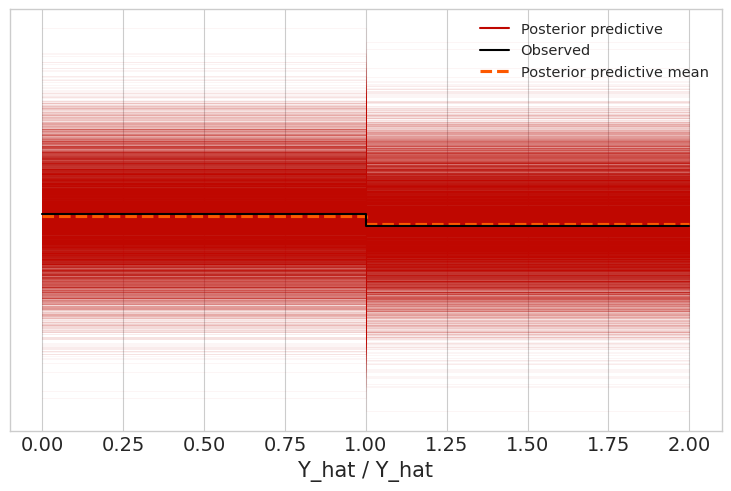

In [108]:
az.plot_ppc(ppc_h, alpha=.04)

### Bayesian p-value

<Axes: title={'center': 'Y_hat / Y_hat'}>

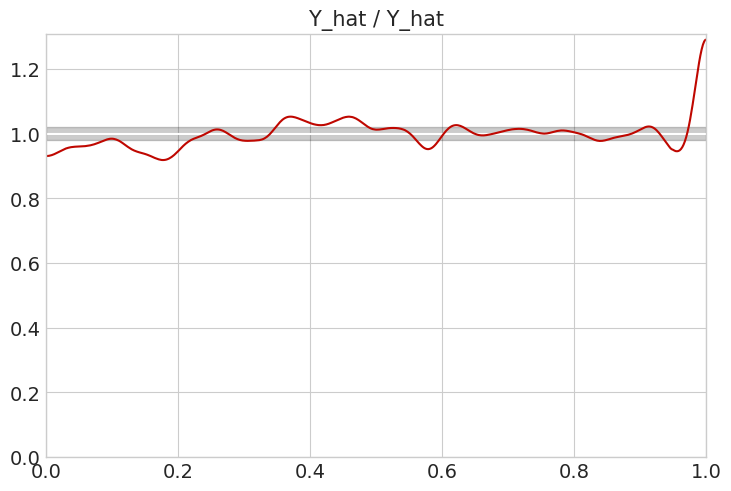

In [ ]:
az.plot_bpv(ppc_h)

### Predicting Something

In [ ]:
with hierarchical_rain:
    pm.set_data({'X': test_df.to_numpy(),
                'location_idx': df5k_d.iloc[test_df.index]['Location'].astype("category").cat.codes.values})
    ppc_h_pred = pm.sample_posterior_predictive(advi_post_hierarchical, 
                                                predictions=True,
                                               random_seed=random_seed)

Sampling: [Y_hat]


In [ ]:
y_pred_hierarchical = pd.Series(ppc_h_pred.predictions['Y_hat'].mean(('chain', 'draw'))).apply(lambda x: 1 if x>0.5 else 0)
confuse_hierarchical = confusion_matrix(test_y, y_pred_hierarchical)

In [ ]:
confuse_hierarchical

array([[3647,  895],
       [1008, 3573]])

In [ ]:
tn, fp, fn, tp = confuse_hierarchical.ravel()

In [ ]:
(tp + tn) / (tn + fp + fn + tp)

0.7914063356352077

In [ ]:
tn

3647

In [ ]:
fp

895

In [ ]:
fn

1008

In [ ]:
tp

3573

### Pretty Graph

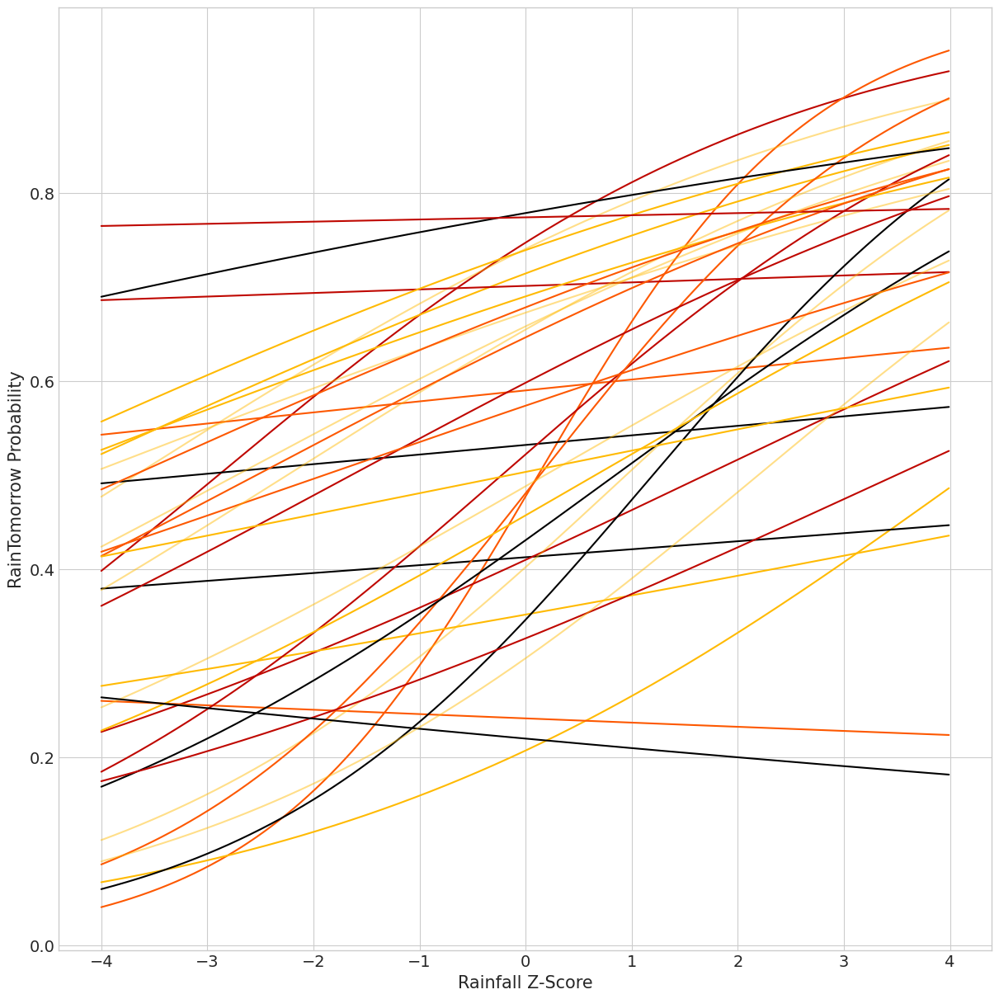

In [ ]:
xvals = np.arange(-4, 4, .01)
b0 = advi_post_hierarchical.posterior['beta0_district'].mean(dim=['draw','chain'])
b1 = advi_post_hierarchical.posterior['beta1_district'].mean(dim=['draw','chain'])
b2 = advi_post_hierarchical.posterior['beta1_district'].mean(dim=['draw','chain'])
b3 = advi_post_hierarchical.posterior['beta1_district'].mean(dim=['draw','chain'])
b4 = advi_post_hierarchical.posterior['beta1_district'].mean(dim=['draw','chain'])
b5 = advi_post_hierarchical.posterior['beta1_district'].mean(dim=['draw','chain'])
b6 = advi_post_hierarchical.posterior['beta1_district'].mean(dim=['draw','chain'])
b7 = advi_post_hierarchical.posterior['beta1_district'].mean(dim=['draw','chain'])
b8 = advi_post_hierarchical.posterior['beta1_district'].mean(dim=['draw','chain'])
b9 = advi_post_hierarchical.posterior['beta1_district'].mean(dim=['draw','chain'])
locations = b1.beta1_district_dim_0 + 1

plt.figure(figsize=(12, 12))
for b0i, b1i, dist in zip(b0, b1, locations):
    yvals = []
    for xval in xvals:
        log_odds = b1i*xval + b0i
        prop = np.exp(log_odds)/(1+np.exp(log_odds))
        yvals.append(prop)
    plt.plot(xvals, yvals, label=dist.values)

plt.xlabel("Rainfall Z-Score")
#plt.legend(fontsize='xx-small', loc='upper right')
plt.ylabel("RainTomorrow Probability");

## Comparing Models

| Pooled        | Positive | Negative |
|---------------|----------|----------|
| Pred Positive | 2319     | 1106     |
| Pred Negative | 2327     | 14467    |

In [ ]:
confuse_pooled

array([[3560,  982],
       [1154, 3427]])

| Unpooled       | Positive | Negative |
|---------------|----------|----------|
| Pred Positive | 2827     | 1504     |
| Pred Negative | 1819     | 14069    |

In [ ]:
confuse_unpooled

array([[3644,  898],
       [1003, 3578]])

| Hierarchical        | Positive | Negative |
|---------------|----------|----------|
| Pred Positive | 2722     | 1303     |
| Pred Negative | 1924     | 14270    |

In [98]:
confuse_hierarchical

array([[3647,  895],
       [1008, 3573]])